In [117]:
import matplotlib 
import matplotlib.pyplot  as plt
import matplotlib.ticker as ticker


import math

import xml.etree.ElementTree as ET
from tqdm import tqdm

import os



def deg2rad(deg):
    return deg * math.pi/180.0

def lonlat2xy(lon, lat, origin_lon, origin_lat): #return coordinates
    EARTH_RADIUS = 6378137.0
    EARTH_RADIUS_cor = EARTH_RADIUS / math.cos(deg2rad(origin_lat))
    return  (EARTH_RADIUS_cor * math.tan(deg2rad(lon - origin_lon)), 
             EARTH_RADIUS     * math.tan(deg2rad(lat - origin_lat)))



# Definition of the function that open an OSM file and output a graph
def openOSM(filename):
    
    # open and parse file
    tree = ET.parse(filename)
    root = tree.getroot()

    # initialize aeroway data
    data = {"trunk":[], "residential":[], "unclassified":[], "secondary":[], "secondary_link":[], "service":[], "track":[], "tertiary":[]}
    plot_format = {"trunk": "r-",
                   "residential": "b-",
                   "unclassified": "c-",
                   "secondary": "k-", 
                   "secondary_link": "y-",
                   "service": "m-", 
                   "track": "g-",
                   "tertiary": "k-",
                   "pedestrian": "k--",
                   "pedestrian": "c--",}
    
    
    # initialize matplot figure
    matplotlib.rcParams.update({'font.size': 20})
    fig, ax = plt.subplots(figsize=(20, 20))   

    lon_min = 180.0
    lat_min = 180.0
    lon_max = -180.0
    lat_max = -180.0
    
    origin_lon = 10000 #39.107
    origin_lat = 10000 #22.320479
    # get All way
    for way in tqdm(root.findall('way')):

            
            
        # if highway
        tag = way.find("tag[@k='highway']")
        if (tag == None ): 
            continue


            

        lon = []
        lat = []
        for i, nd in enumerate(way.findall("nd")):
            
            node = root.find("node[@id='"+nd.get("ref")+"']")
            
            
            
            if (origin_lon>5000): origin_lon = float(node.get("lon"))
            if (origin_lat>5000): origin_lat = float(node.get("lat"))
#             origin_lat = 22.320479
            
            (x,y) = lonlat2xy(float(node.get("lon")), float(node.get("lat")), origin_lon, origin_lat)
            lon.append(x)
            lat.append(y)
            
            if (x > lon_max): lon_max = x
            if (x < lon_min): lon_min = x
            if (y > lat_max): lat_max = y
            if (y < lat_min): lat_min = y
                
        v = tag.get('v')
        for data_type in data:
            if (v == data_type):
                data[data_type].append({"lon" : lon ,'lat' : lat})
                
            
           

    
    # plot data and define legend
    plt_all  = []
    leg_all = []
    for data_type in data:
        for way in data[data_type]:   
            plt_type,   = plt.plot(way["lon"], way["lat"], plot_format[data_type], markersize=5, markeredgewidth =2)
            
        if len(data[data_type]) > 0 :
            plt_all.append(plt_type), leg_all.append(data_type)
         
    # polish figure
    plt.title(filename)
    plt.xlabel("X (m)")
    plt.ylabel("Y (m)")
#     axes = plt.gca()
#     print("lon", lon_min, lon_max)
#     print("lat", lat_min, lat_max)
    plt.axis('square')   
    ax.set_aspect('equal') 
#     ax.set_xlim([lon_min-(lon_max-lon_min)*0.1,lon_max+(lon_max-lon_min)*0.05])
#     ax.set_ylim([lat_min-(lat_max-lat_min)*0.1,lat_max+(lat_max-lat_min)*0.05])
#     ax.xaxis.set_major_locator(ticker.MultipleLocator(0.01))
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(0.01))

    plt.legend(plt_all, leg_all, loc='lower left')    
#     plt.grid()
    ax.set_axisbelow(True)
    ax.xaxis.grid(color=[0.9,0.9,0.9], linestyle='dashed')
    ax.yaxis.grid(color=[0.9,0.9,0.9], linestyle='dashed')

    plt.show()
    
    fig.savefig(os.path.splitext(os.path.basename(filename))[0]+'.png', bbox_inches='tight')
    
    return data
    

100%|██████████| 106/106 [00:00<00:00, 755.78it/s]


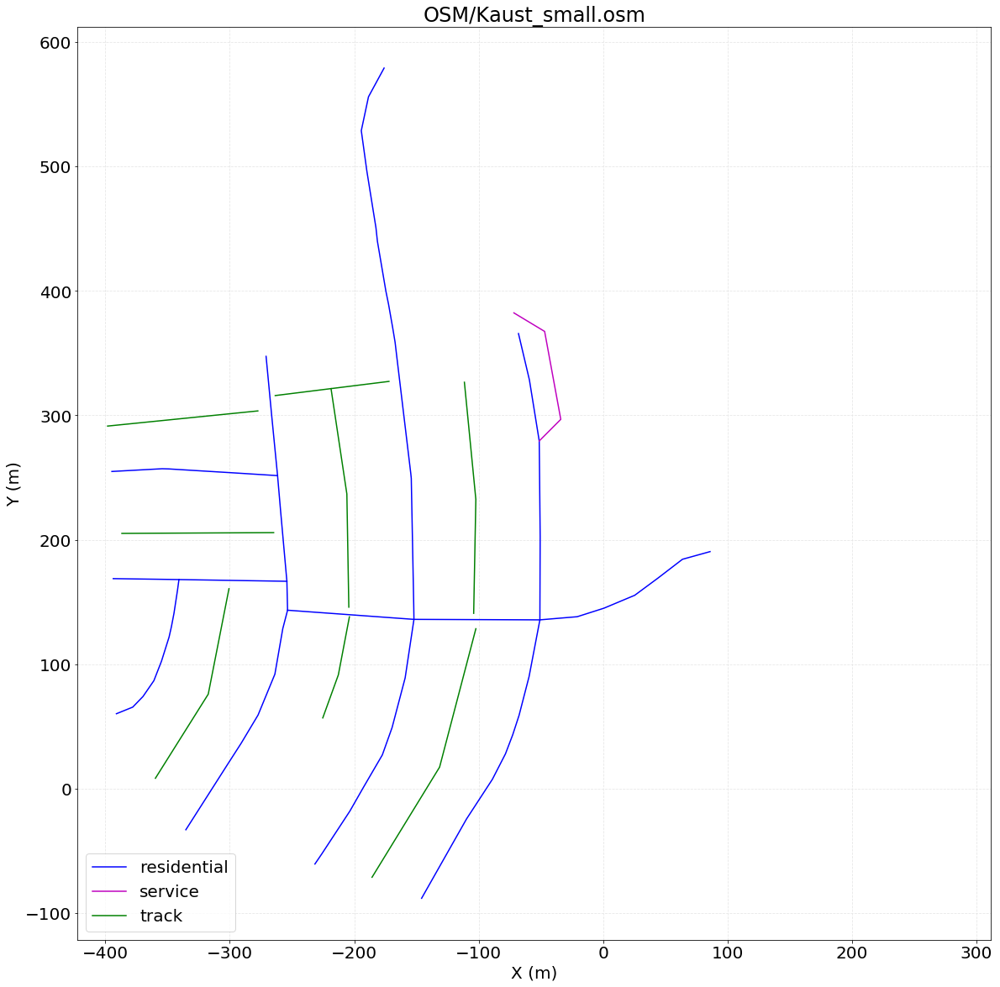

In [118]:
data = openOSM("OSM/Kaust_small.osm")

100%|██████████| 2732/2732 [00:15<00:00, 171.92it/s]


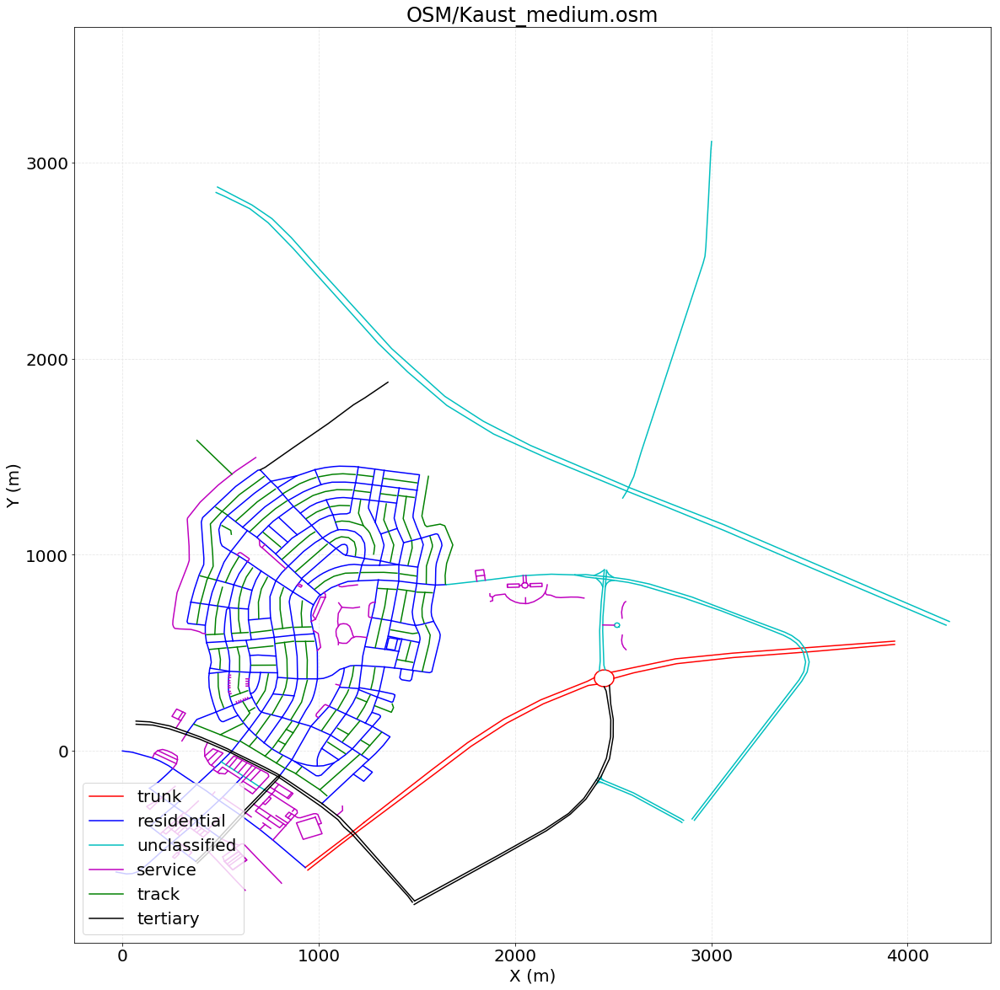

In [119]:
data = openOSM("OSM/Kaust_medium.osm")

100%|██████████| 5652/5652 [01:05<00:00, 86.59it/s] 


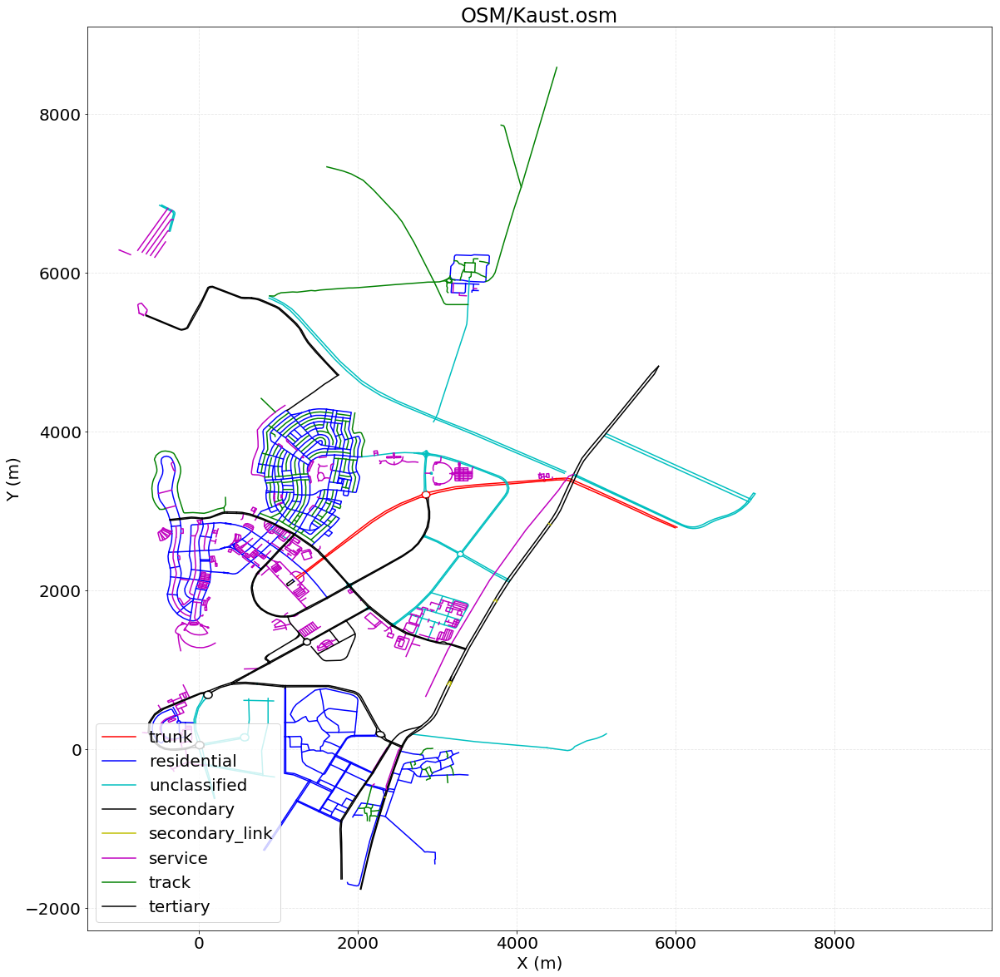

In [120]:
data = openOSM("OSM/Kaust.osm")

100%|██████████| 2085/2085 [00:08<00:00, 249.37it/s]


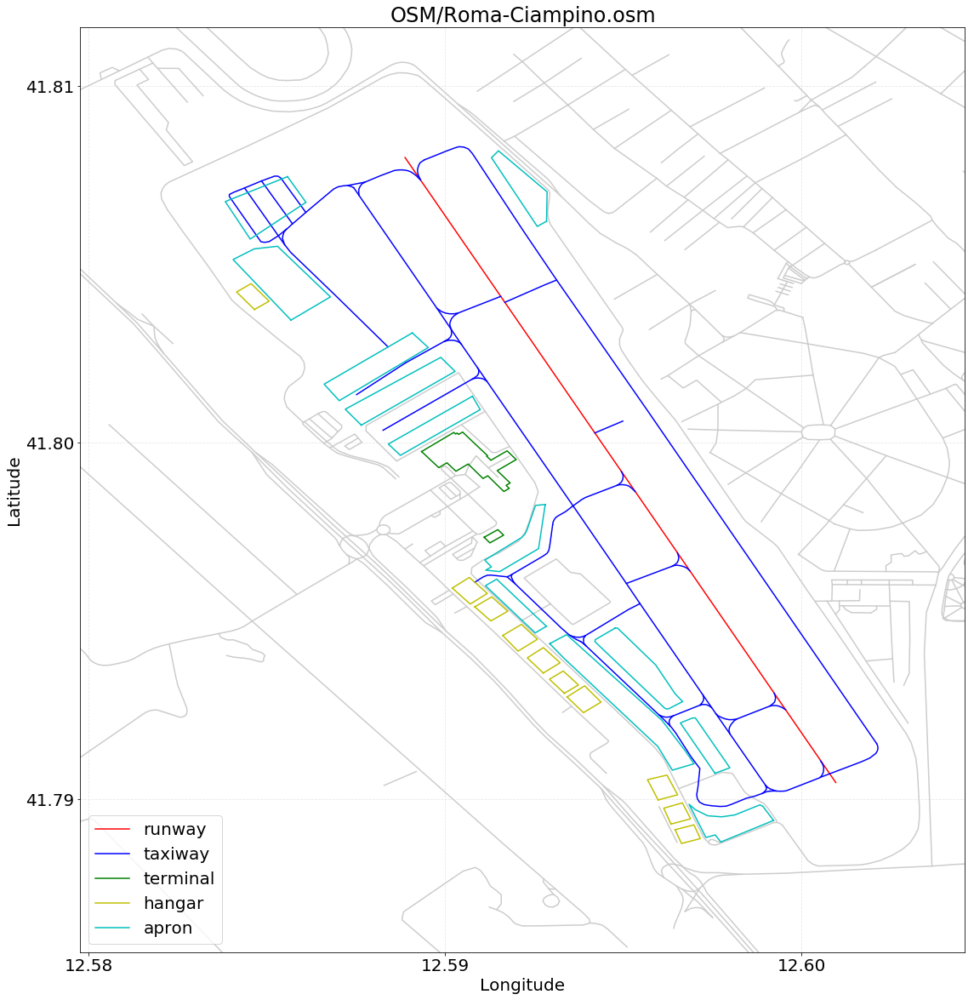

In [3]:
data = openOSM("OSM/Roma-Ciampino.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 2486/2486 [00:29<00:00, 85.05it/s]


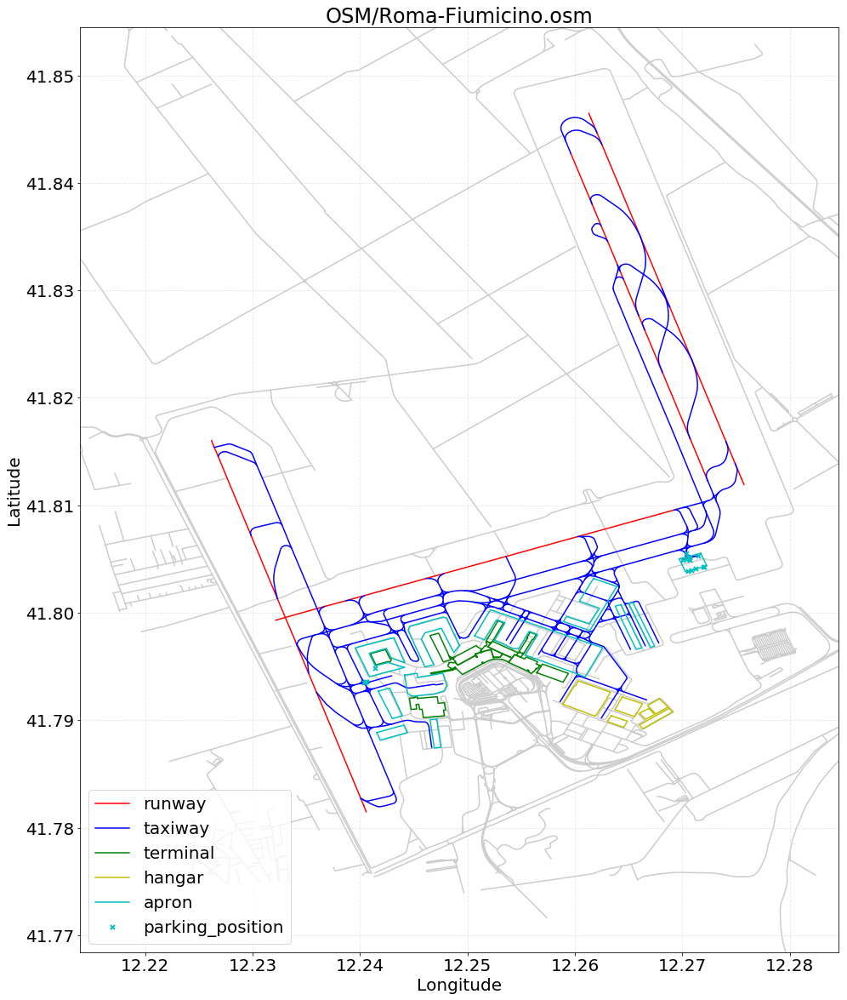

In [4]:
data = openOSM("OSM/Roma-Fiumicino.osm")

100%|█████████████████████████████████████████████████████████████████████████████| 1434/1434 [00:13<00:00, 105.75it/s]


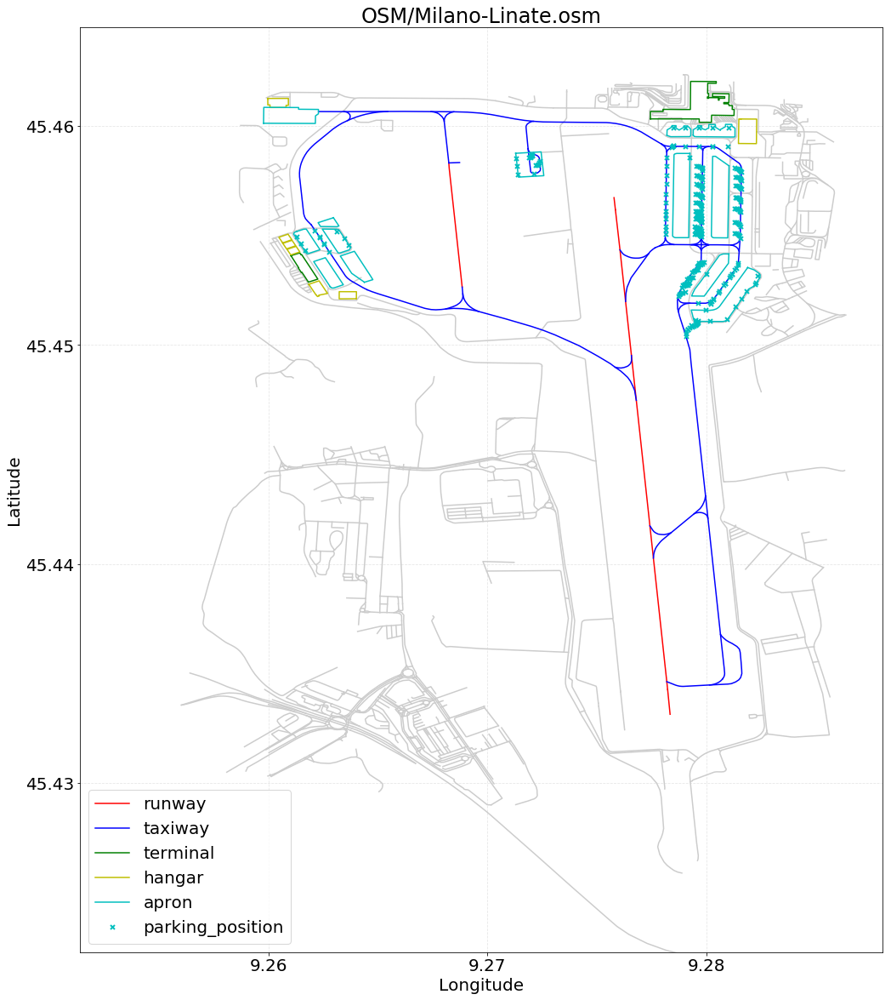

In [5]:
data = openOSM("OSM/Milano-Linate.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1939/1939 [00:30<00:00, 62.57it/s]


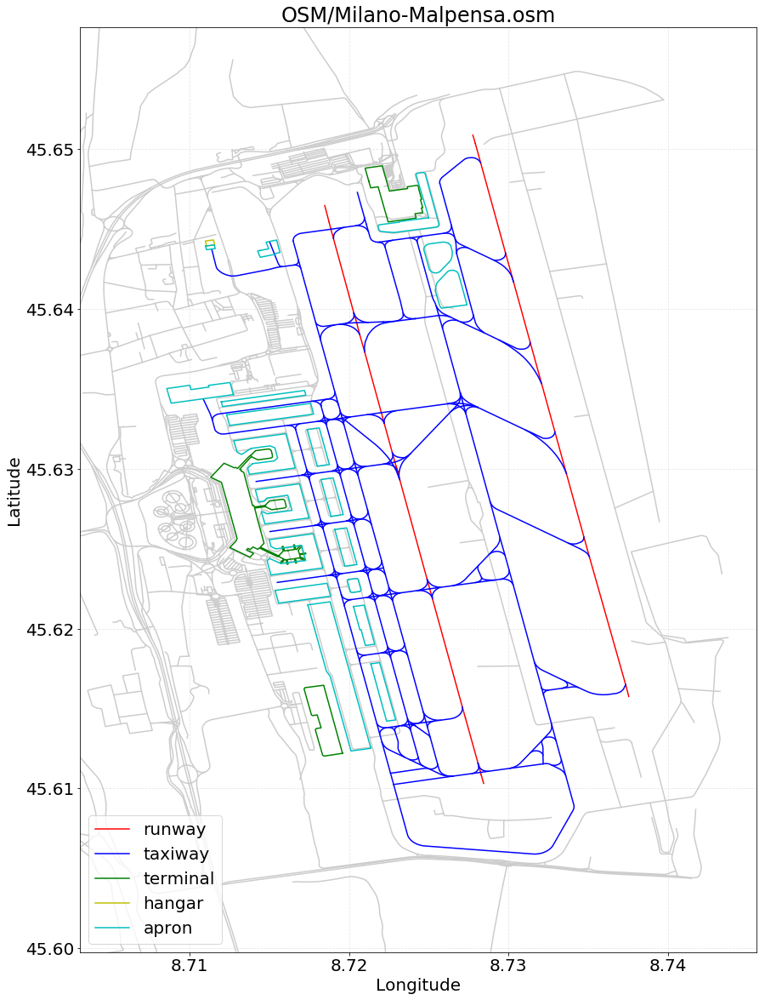

In [6]:
data = openOSM("OSM/Milano-Malpensa.osm")

100%|█████████████████████████████████████████████████████████████████████████████| 1136/1136 [00:05<00:00, 200.93it/s]


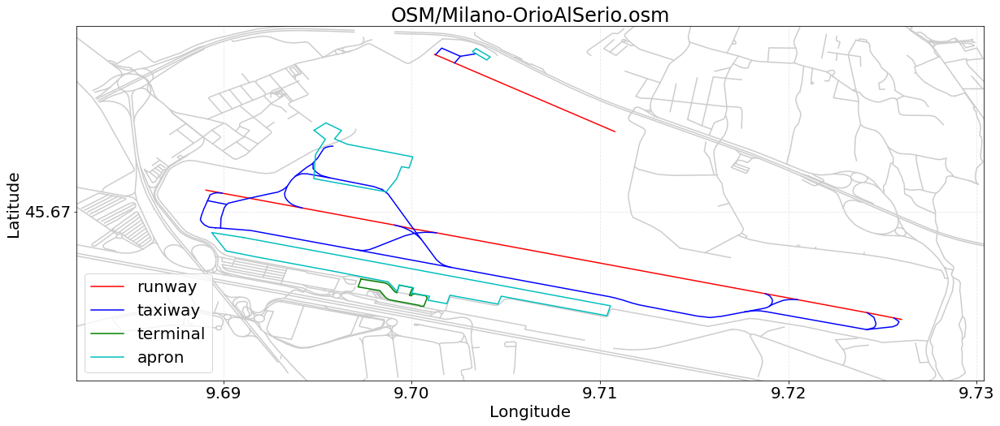

In [7]:
data = openOSM("OSM/Milano-OrioAlSerio.osm")

100%|███████████████████████████████████████████████████████████████████████████████| 849/849 [00:04<00:00, 175.45it/s]


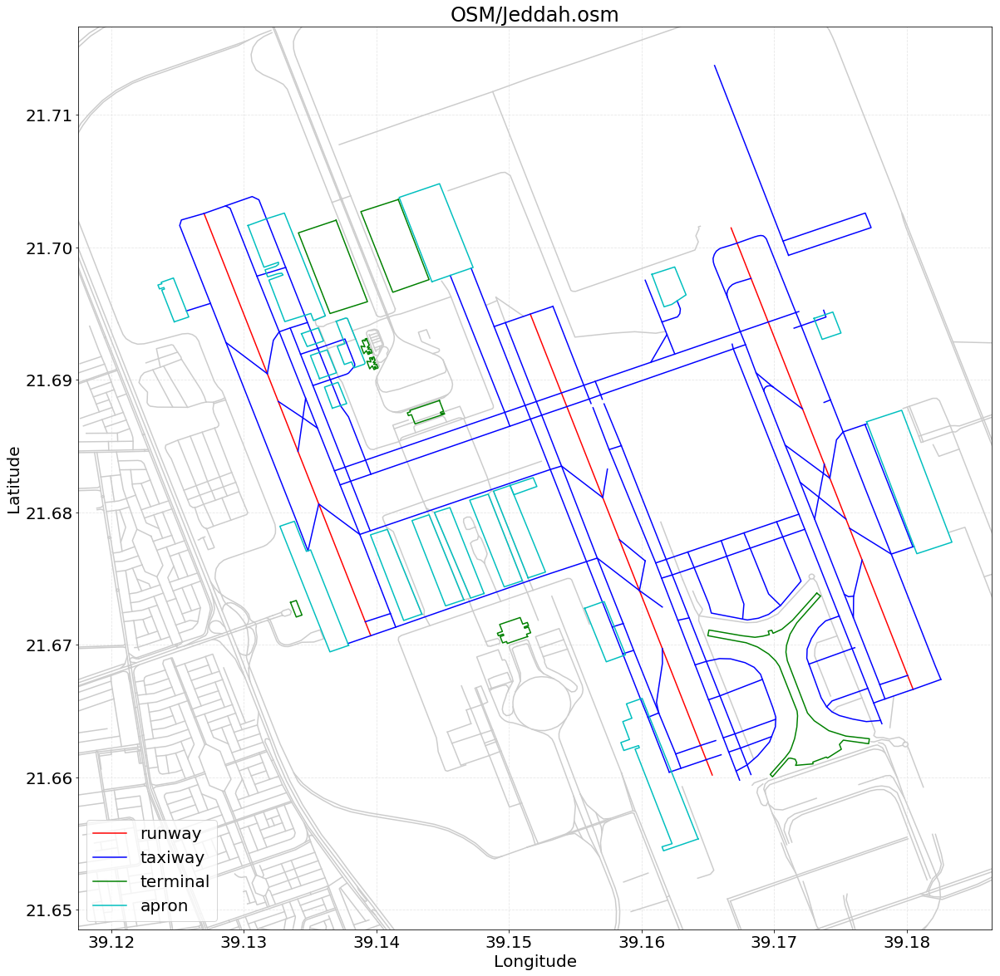

In [8]:
data = openOSM("OSM/Jeddah.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 4251/4251 [00:47<00:00, 89.31it/s]


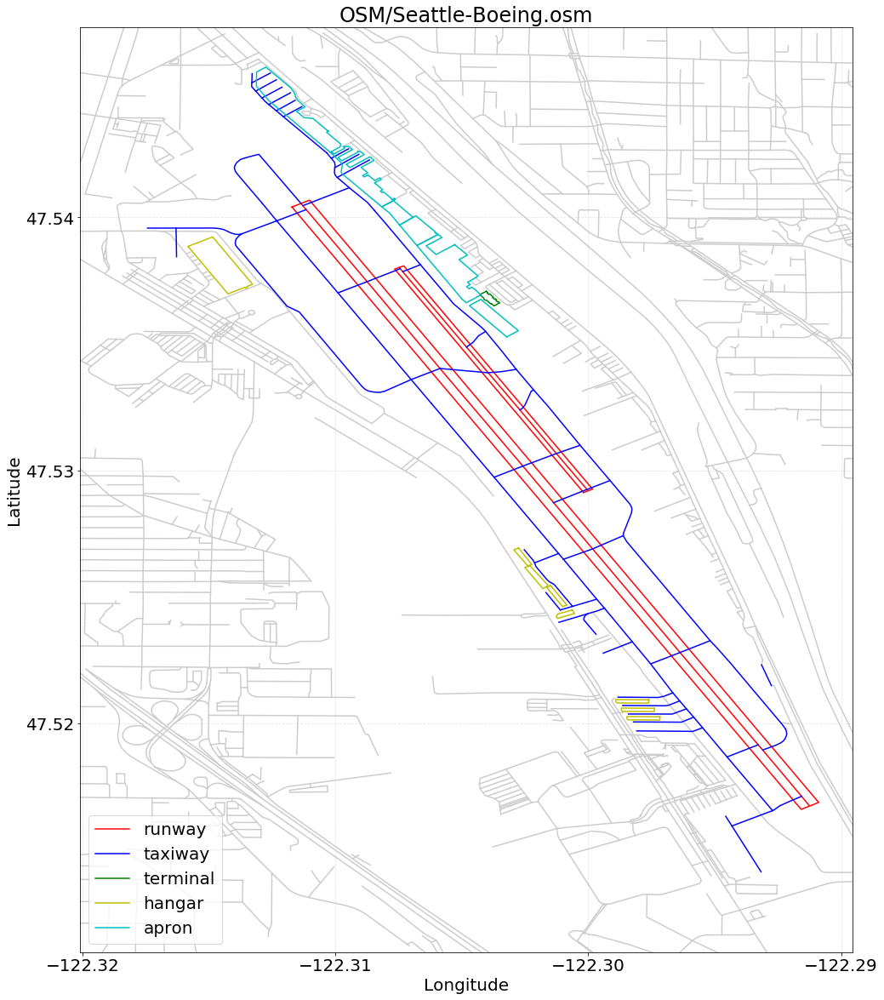

In [9]:
data = openOSM("OSM/Seattle-Boeing.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 7159/7159 [04:47<00:00, 24.90it/s]


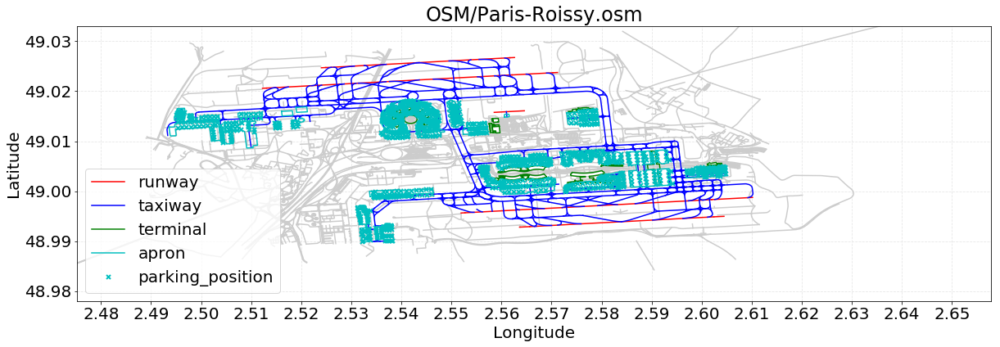

In [10]:
data = openOSM("OSM/Paris-Roissy.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 6954/6954 [02:18<00:00, 50.34it/s] 75%|█████████████████████████████████████████████████████████▍                   | 5187/6954 [00:50<00:17, 103.36it/s]


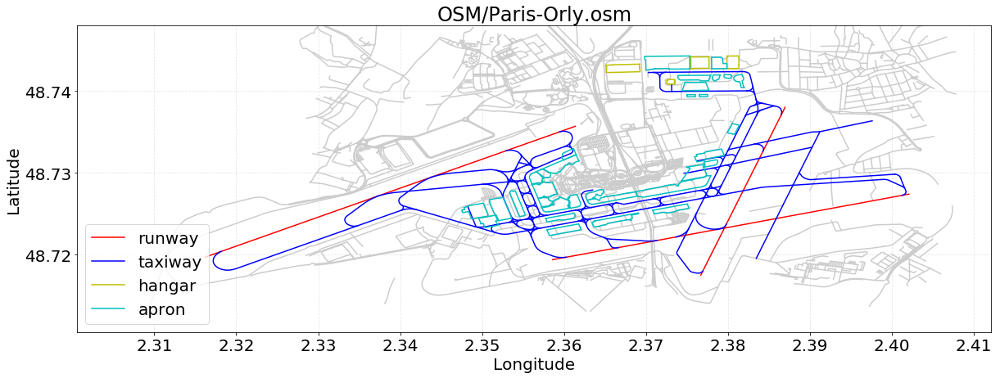

In [11]:
data = openOSM("OSM/Paris-Orly.osm")

100%|█████████████████████████████████████████████████████████████████████████████| 1313/1313 [00:03<00:00, 346.55it/s]


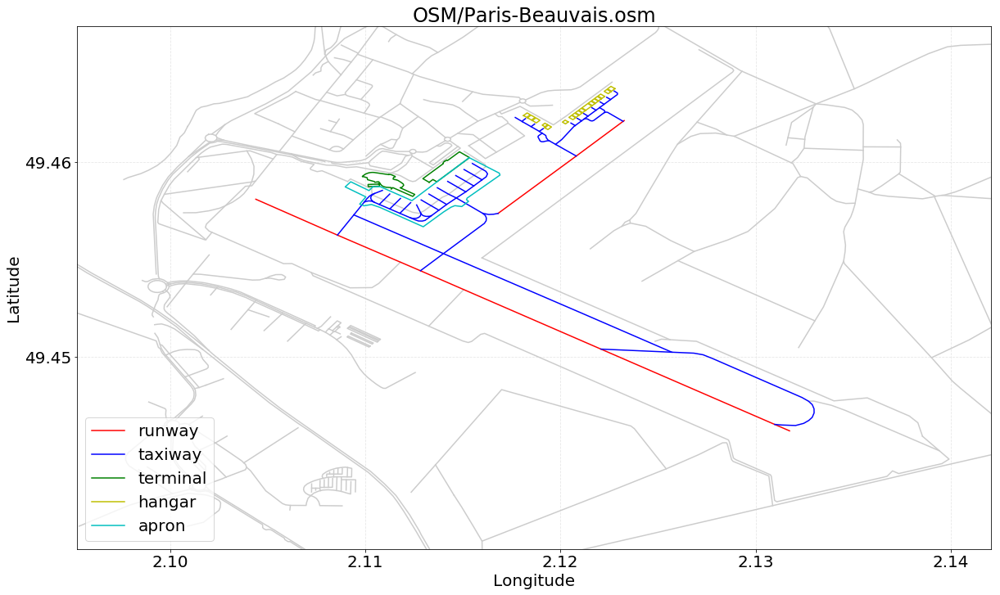

In [12]:
data = openOSM("OSM/Paris-Beauvais.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 4683/4683 [01:27<00:00, 18.36it/s]


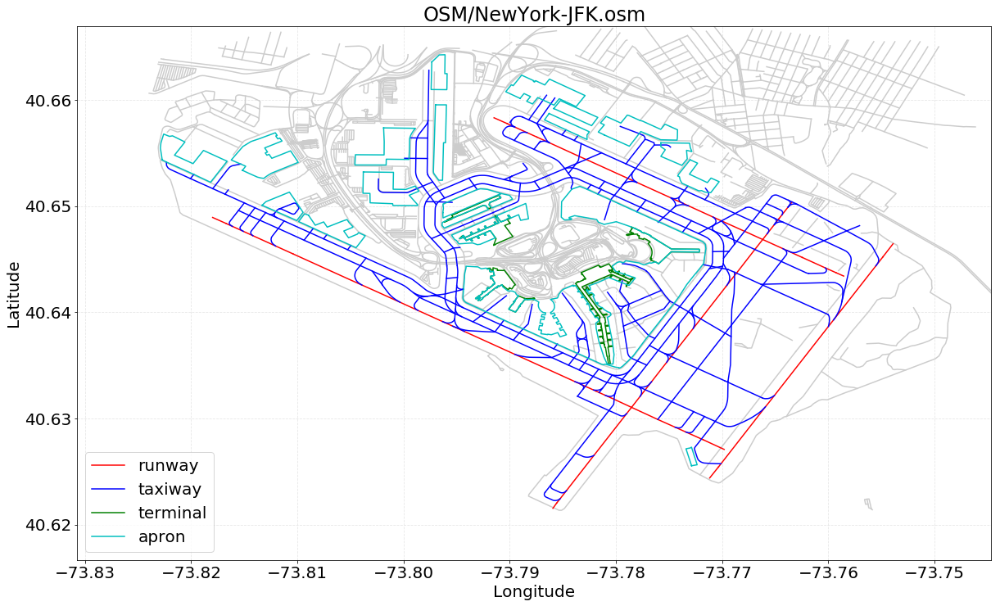

In [13]:
data = openOSM("OSM/NewYork-JFK.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1954/1954 [00:25<00:00, 75.83it/s]


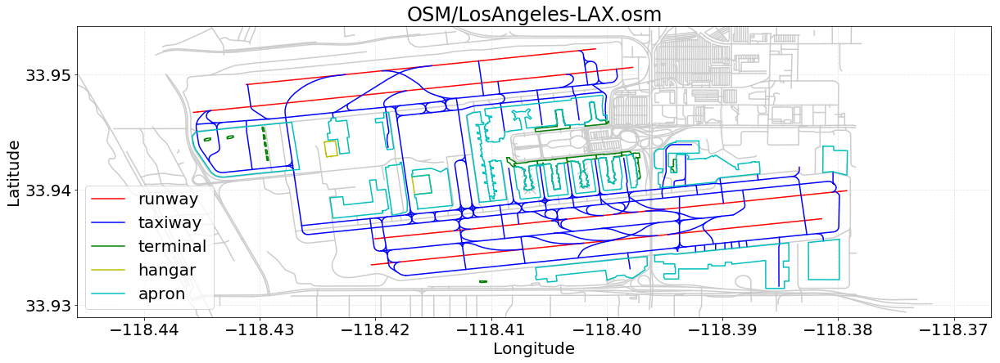

In [14]:
data = openOSM("OSM/LosAngeles-LAX.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 3516/3516 [01:20<00:00, 43.55it/s]


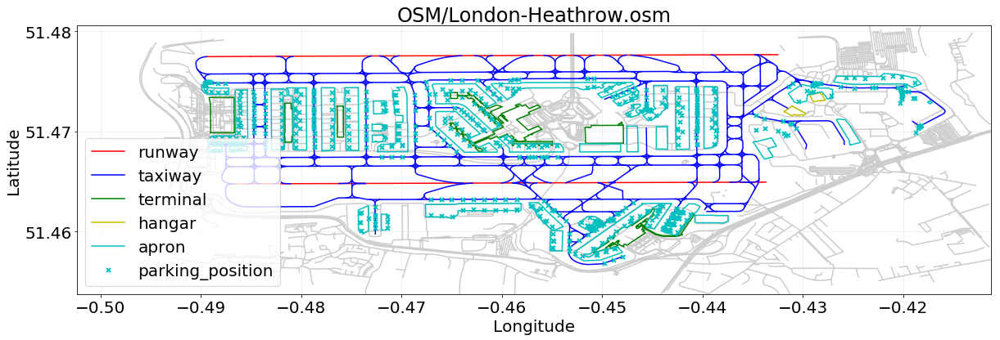

In [15]:
data = openOSM("OSM/London-Heathrow.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 2761/2761 [00:50<00:00, 54.59it/s]


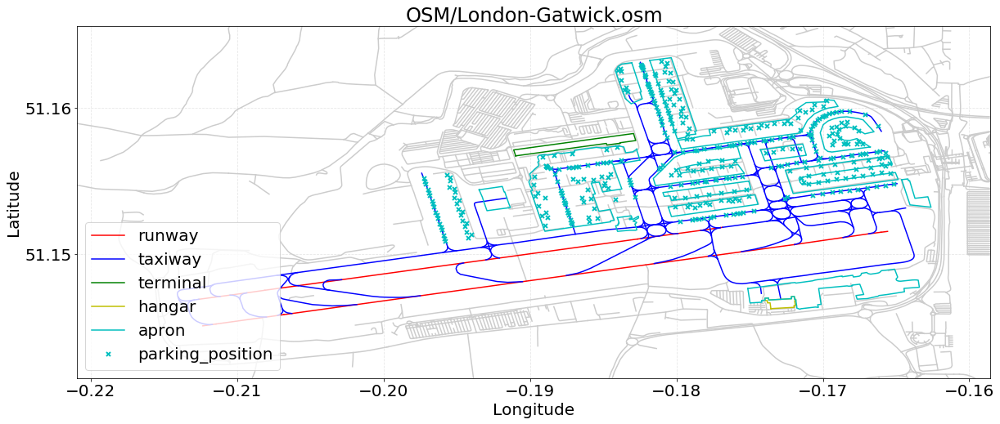

In [16]:
data = openOSM("OSM/London-Gatwick.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 3241/3241 [01:28<00:00, 36.44it/s]


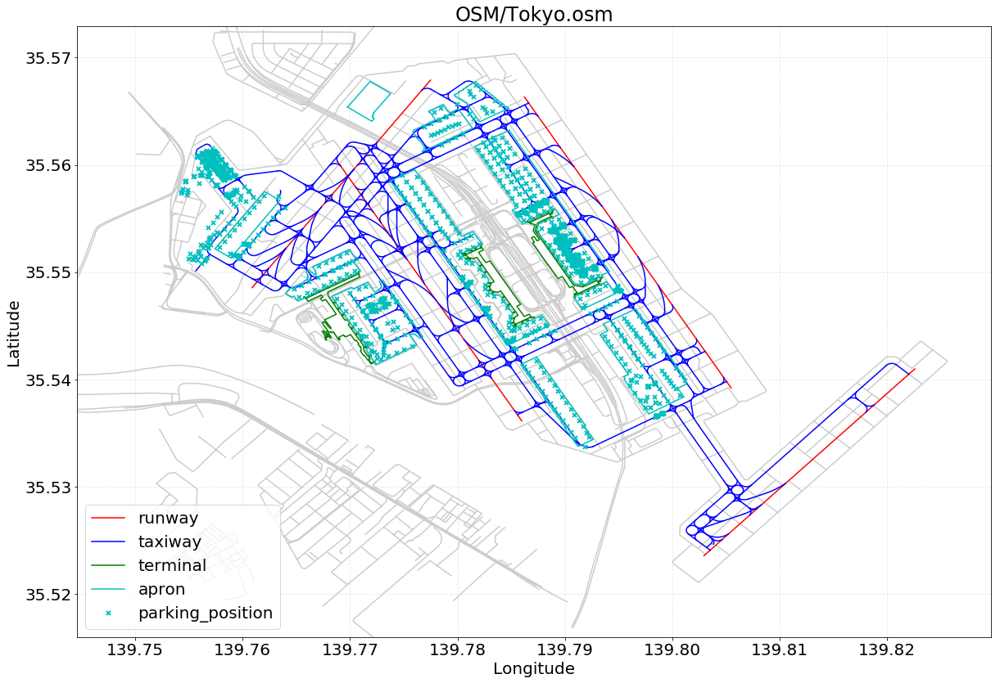

In [17]:
data = openOSM("OSM/Tokyo.osm")

100%|███████████████████████████████████████████████████████████████████████████████| 472/472 [00:03<00:00, 120.35it/s]


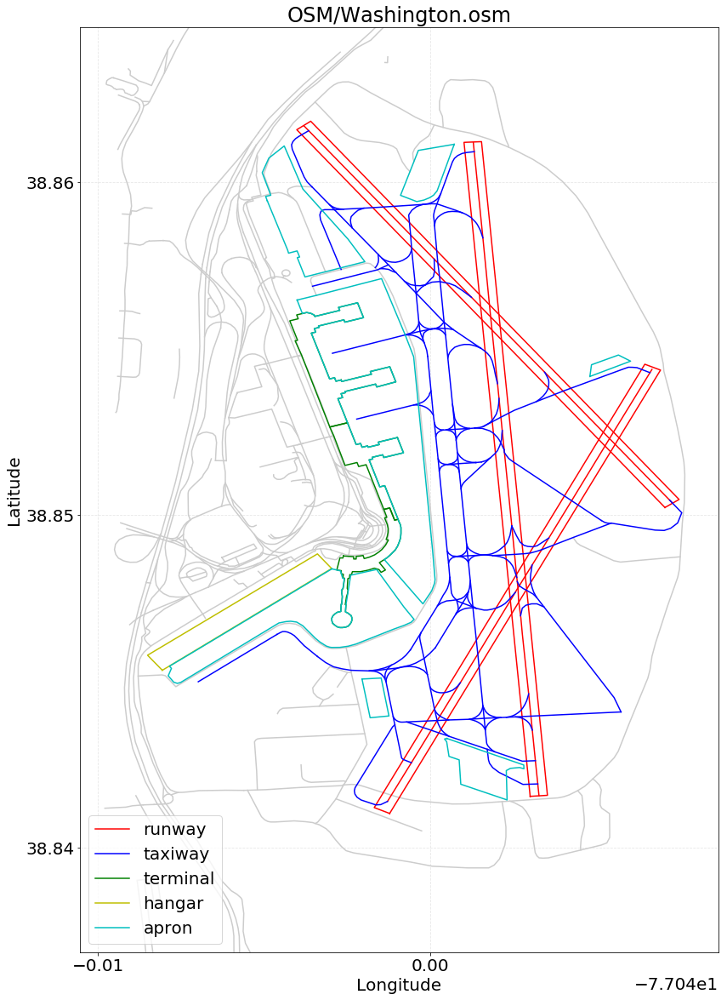

In [18]:
data = openOSM("OSM/Washington.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1376/1376 [00:21<00:00, 64.75it/s]


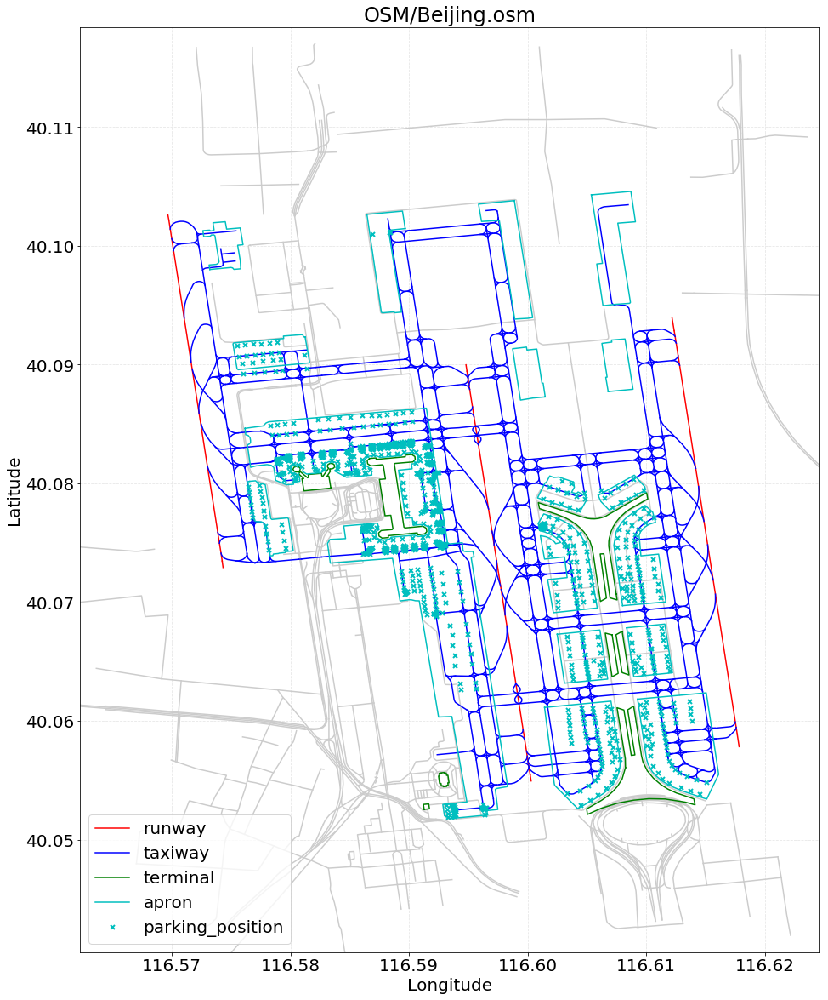

In [19]:
data = openOSM("OSM/Beijing.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1599/1599 [00:25<00:00, 63.63it/s]


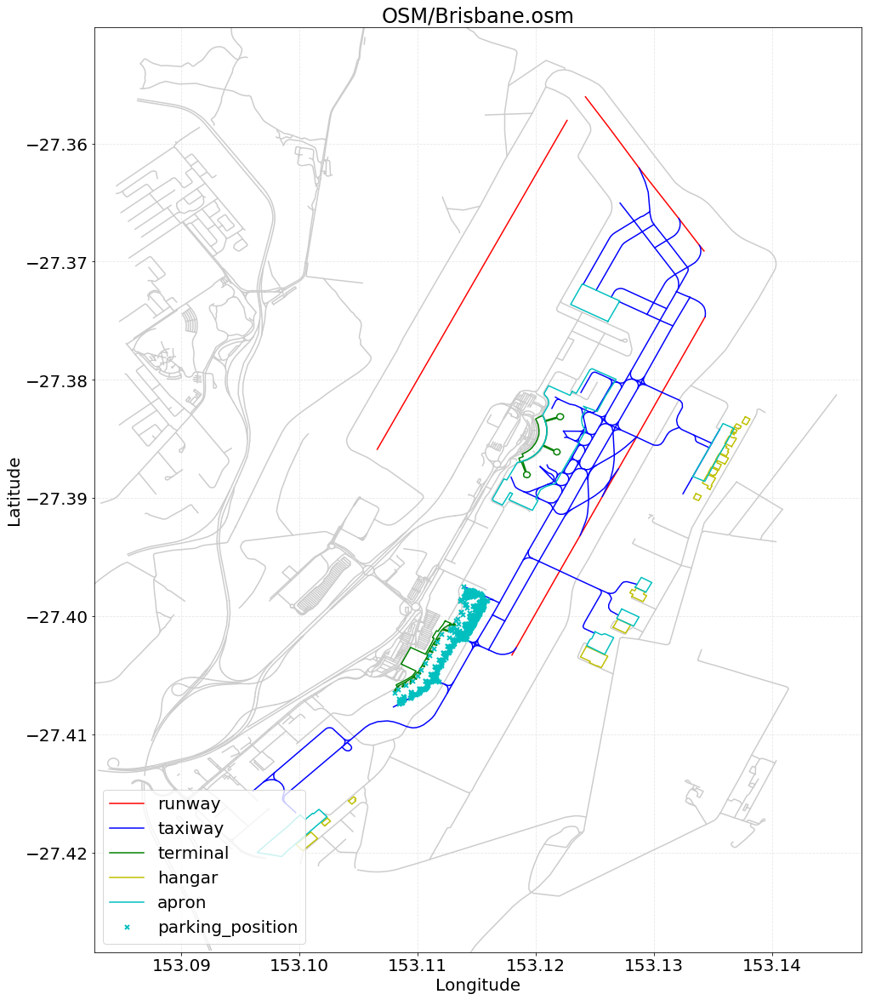

In [20]:
data = openOSM("OSM/Brisbane.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 4397/4397 [01:30<00:00, 48.53it/s]


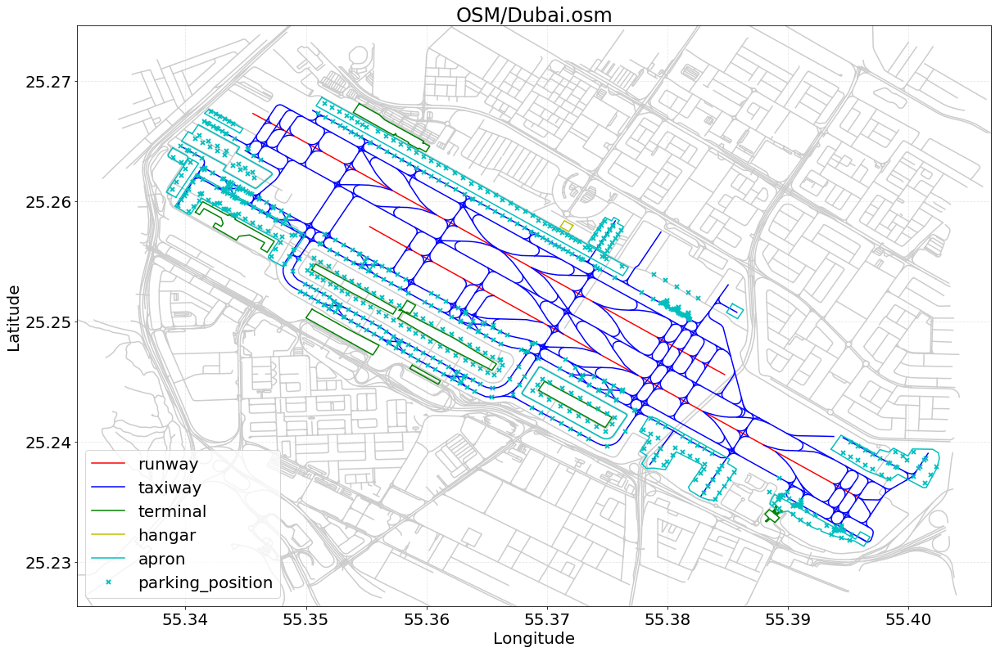

In [21]:
data = openOSM("OSM/Dubai.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1697/1697 [00:34<00:00, 49.67it/s]


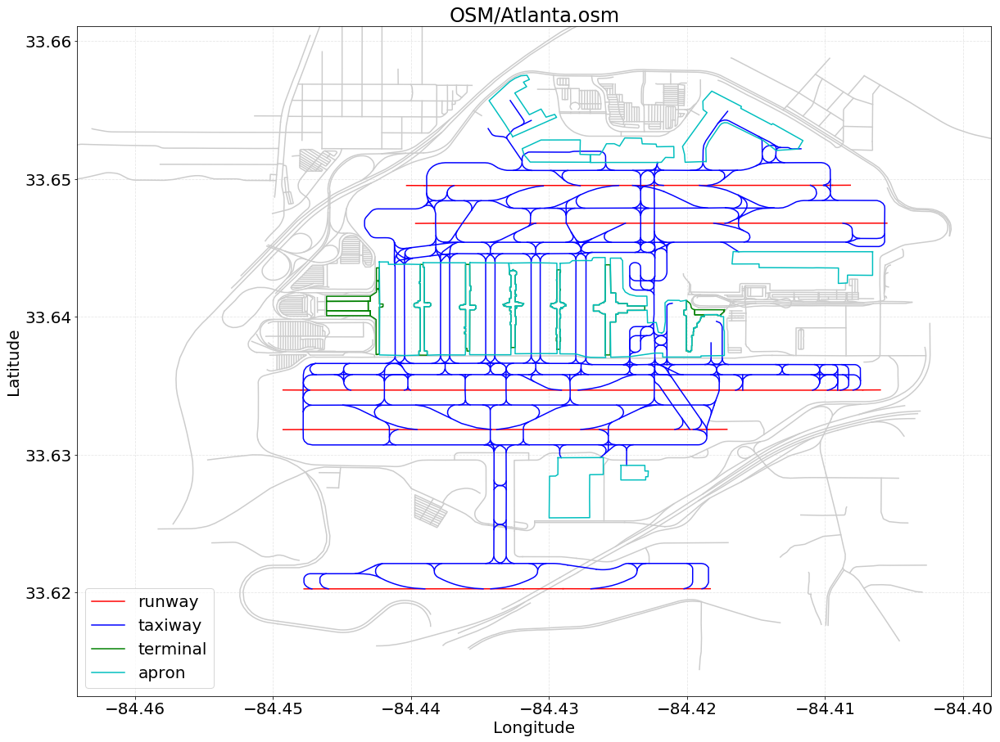

In [22]:
data = openOSM("OSM/Atlanta.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 2808/2808 [01:04<00:00, 14.20it/s]


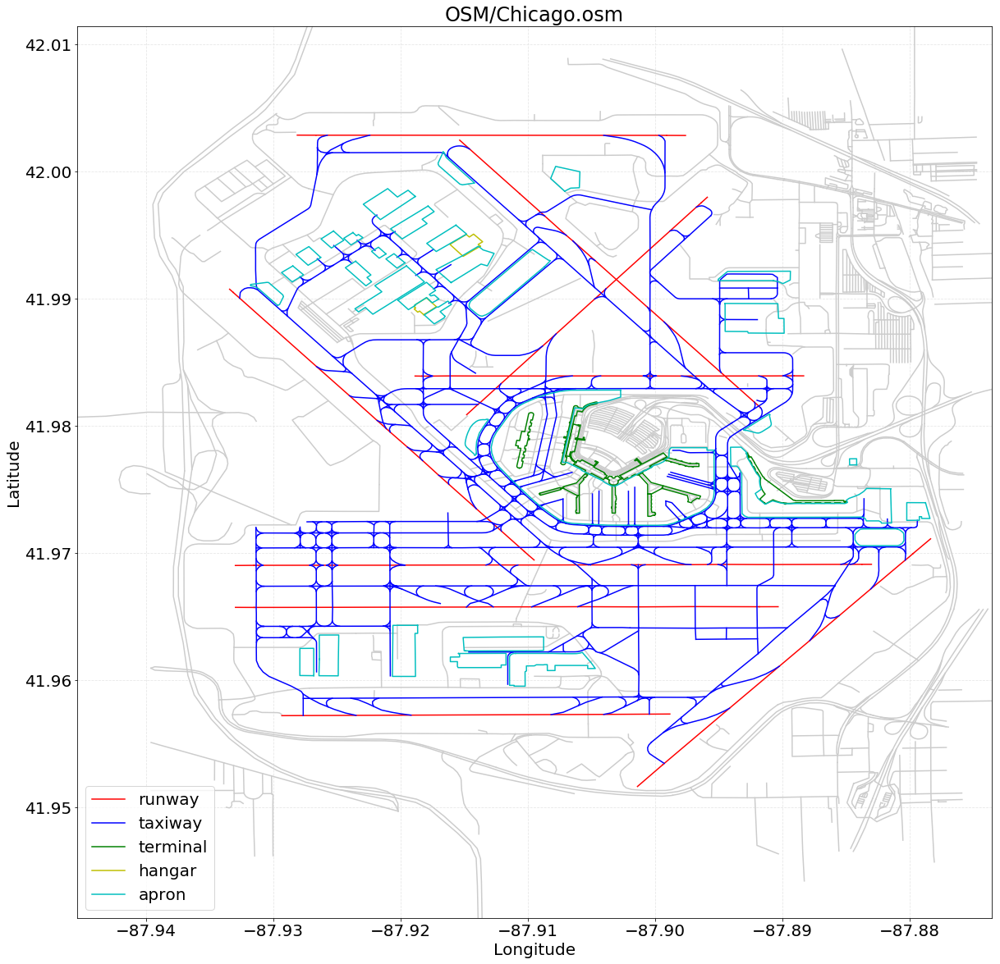

In [23]:
data = openOSM("OSM/Chicago.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 4365/4365 [02:23<00:00, 11.20it/s]


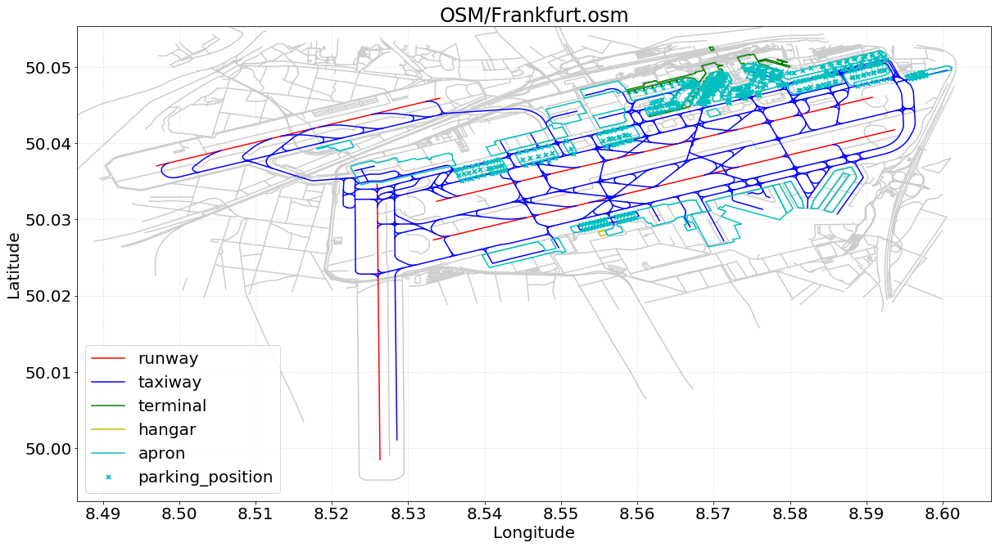

In [24]:
data = openOSM("OSM/Frankfurt.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 2830/2830 [01:09<00:00, 40.72it/s]


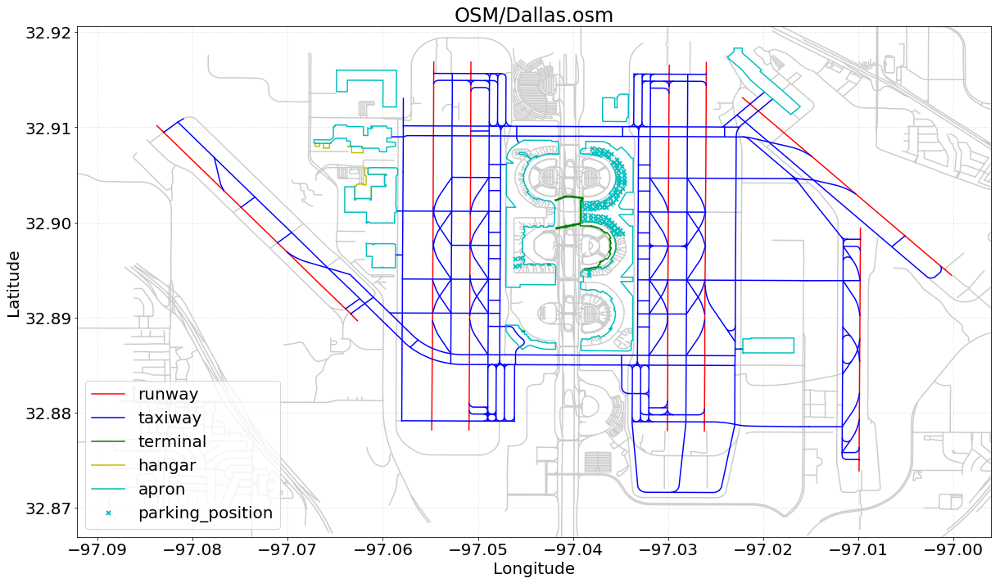

In [25]:
data = openOSM("OSM/Dallas.osm")

100%|██████████████████████████████████████████████████████████████████████████████| 1335/1335 [00:19<00:00, 69.40it/s]


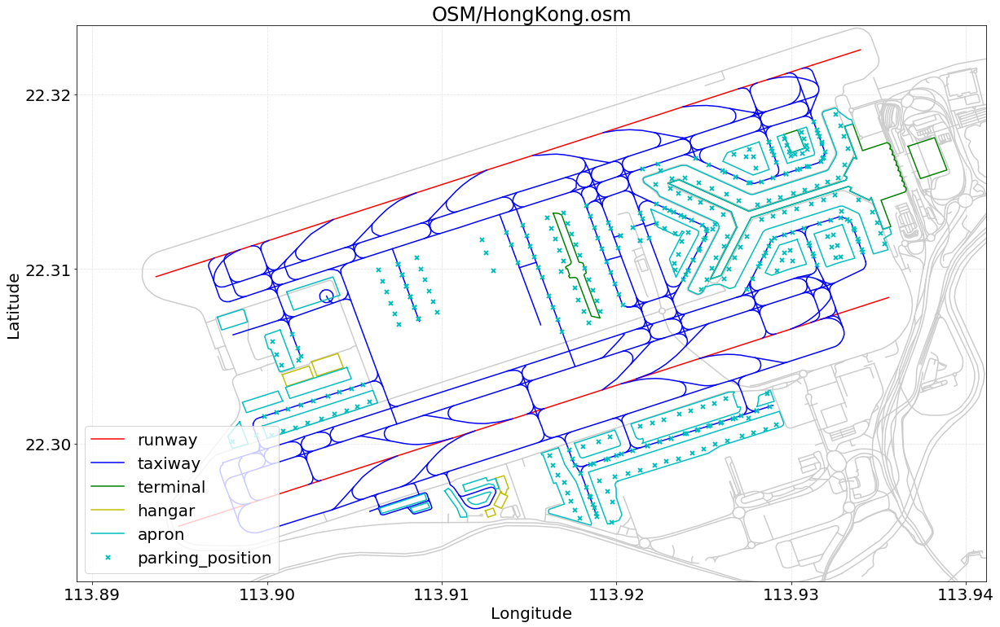

In [26]:
data = openOSM("OSM/HongKong.osm")

100%|███████████████████████████████████████████████████████████████████████████████| 134/134 [00:00<00:00, 204.04it/s]


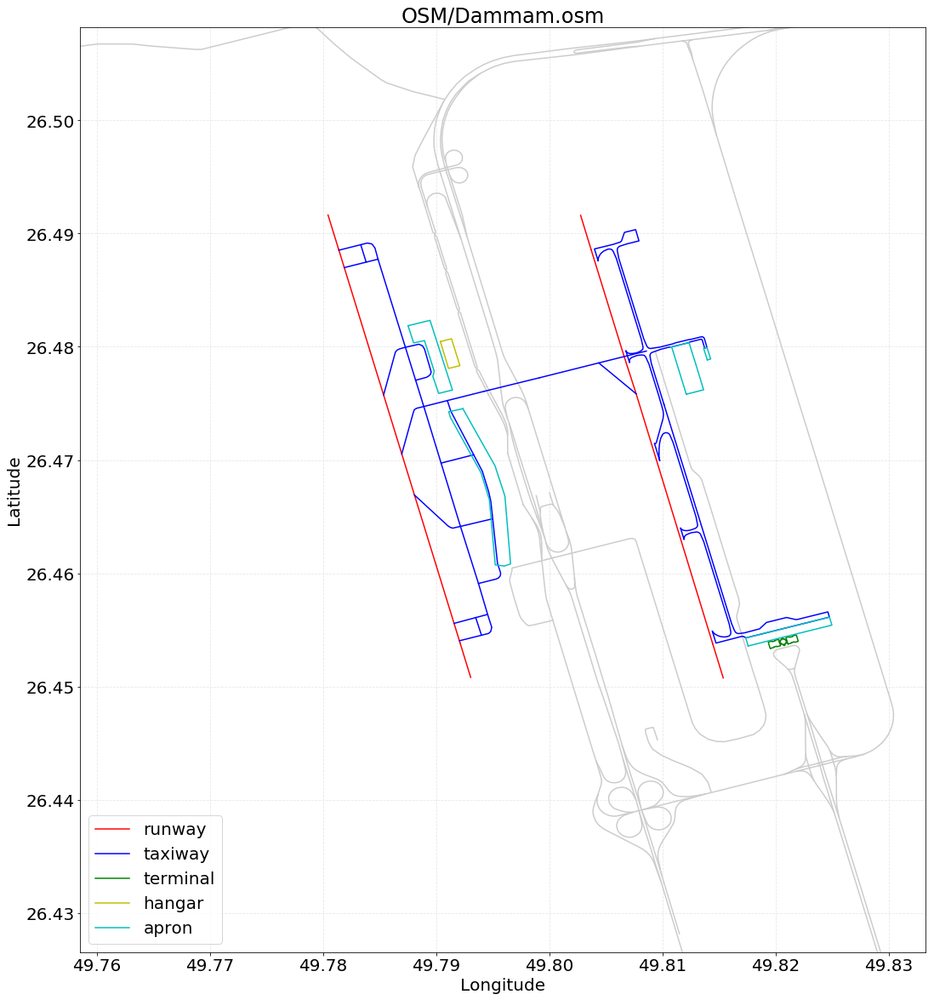

In [27]:
data = openOSM("OSM/Dammam.osm")

In [28]:
# DEBUG

In [29]:
# filename= "London-Heathrow.osm"


# import xml.etree.ElementTree as ET
# from tqdm import tqdm



# tree = ET.parse(filename)
# root = tree.getroot()


# # print(root.tag)
# # print(root.attrib)

# runway = []
# taxiway = []
# apron = []
# terminal = []
# hangar = []
# parking = []





# for way in tqdm(root.findall('way')):
#     tag = way.find("tag[@k='aeroway']")
#     if (tag == None ): continue

#     v = tag.get('v')
#     if (v == "terminal"): print(v)



#     lon = []
#     lat = []
#     for i, nd in enumerate(way.findall("nd")):

#         node = root.find("node[@id='"+nd.get("ref")+"']")

#         lon.append(node.get("lon"))
#         lat.append(node.get("lat"))

#     way = {"lon" : lon ,'lat' : lat}
#     if (v == "runway"): runway.append(way)
#     if (v == "taxiway"): taxiway.append(way)
#     if (v == "apron"): apron.append(way)
#     if (v == "terminal"): terminal.append(way)
#     if (v == "hangar"): hangar.append(way)
#     if (v == "parking_position"): parking.append(way)

In [30]:


# import matplotlib 
# import matplotlib.pyplot  as plt

# matplotlib.rcParams.update({'font.size': 20})
# fig, ax = plt.subplots(figsize=(20, 20))

# plt.title(filename)
# plt.xlabel("Longitude")
# plt.ylabel("Latitude")
# plt.axis('equal')  

# for way in runway:           plt_runway, = plt.plot(way["lon"], way["lat"], "r-")
# for way in taxiway:          plt_taxiway, = plt.plot(way["lon"], way["lat"], "b-")
# for way in terminal:           plt_terminal, = plt.plot(way["lon"], way["lat"])
# for way in hangar:           plt_hangar, = plt.plot(way["lon"], way["lat"], "y-")
# for way in apron:            plt_apron, = plt.plot(way["lon"], way["lat"], "g-")
# for way in parking:  plt_parking, = plt.plot(way["lon"], way["lat"], "xg", markersize=10, markeredgewidth =3)


# has_runway = len(runway)>0 
# has_taxiway = len(taxiway)>0 
# has_terminal = len(terminal)>0 
# has_hangar = len(hangar)>0 
# has_apron = len(apron)>0 
# has_parking = len(parking)>0 

# plt_all = []
# leg_all = []
# if (has_runway) : plt_all.append(plt_runway), leg_all.append('Run Away')
# if (has_taxiway) : plt_all.append(plt_taxiway), leg_all.append('Taxi Way')
# if (has_terminal) : plt_all.append(plt_terminal), leg_all.append('Terminal')
# if (has_hangar) : plt_all.append(plt_hangar), leg_all.append('Hangar')
# if (has_apron) : plt_all.append(plt_apron), leg_all.append('Apron')
# if (has_parking) : plt_all.append(plt_parking), leg_all.append('Parking')


# plt.legend(plt_all, leg_all)

# plt.grid()

# plt.show()






# # fig, ax = plt.subplots(figsize=(5, 5), dpi=300)

# # fig, ax = plt.subplots(figsize=(20, 20))
# # plt.title(filename)
# # plt.xlabel("Longitude")
# # plt.ylabel("Latitude")

# # for way in runway:           plt_runway, = plt.plot(way["lon"], way["lat"], "r-")
# # for way in taxiway:          plt_taxiway, = plt.plot(way["lon"], way["lat"], "b-")
# # for way in terminal:         plt_terminal, = plt.plot(way["lon"], way["lat"], "k-")
# # for way in hangar:           plt_hangar, = plt.plot(way["lon"], way["lat"], "y-")
# # for way in apron:            plt_apron, = plt.plot(way["lon"], way["lat"], "g-")
# # for way in parking_position: plt_parking, = plt.plot(way["lon"], way["lat"], "xg", markersize=10, markeredgewidth =3)

# # plt.legend([plt_runway, plt_taxiway, plt_terminal, plt_hangar, plt_apron, plt_parking], 
# #            ['Run Away', 'Taxi Way', 'Terminal', 'Hangar', 'Apron', 'Parking'])

# # plt.grid()

# # plt.show()